In [3]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [4]:
!git clone https://github.com/facebookresearch/detectron2.git
%cd detectron2

fatal: destination path 'detectron2' already exists and is not an empty directory.
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face/detectron2


In [ ]:
!pip install -U 'git+https://github.com/facebookresearch/detectron2.git'

In [5]:
import sys
import os
import yaml
import numpy as np
import torch

sys.path.insert(0, '/content/gdrive/MyDrive/Hugging Face/detectron2')

In [6]:
%cd /content/gdrive/MyDrive/Hugging Face/

/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [2]:
import detectron2
print(detectron2.__file__)
# It should show something like: /usr/local/lib/python3.10/dist-packages/detectron2/__init__.py

/usr/local/lib/python3.12/dist-packages/detectron2/__init__.py


In [ ]:
import torch
# Get the version of Torch and CUDA in current Colab session
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]

# Install the matching pre-built Detectron2 wheel
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/torch{TORCH_VERSION}/index.html

In [7]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [8]:
!git clone https://github.com/hujiecpp/YOSO.git
%cd YOSO/projects/YOSO

fatal: destination path 'YOSO' already exists and is not an empty directory.
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face/YOSO/projects/YOSO


In [9]:
import sys
import os
import yaml
import numpy as np
import torch

sys.path.insert(0, '/content/gdrive/MyDrive/Hugging Face/YOSO/projects/YOSO')

In [10]:
%cd /content/gdrive/MyDrive/Hugging Face/YOSO/projects/YOSO

/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face/YOSO/projects/YOSO


In [12]:
from yoso.config import add_yoso_config

In [13]:
%cd /content/gdrive/MyDrive/Hugging Face/

/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [18]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from yoso.config import add_yoso_config

cfg = get_cfg()
add_yoso_config(cfg)

# Use YOSO with ResNet-50
cfg.merge_from_file("YOSO/projects/YOSO/configs/coco/panoptic-segmentation/YOSO-R50.yaml")
cfg.MODEL.WEIGHTS = "https://github.com/hujiecpp/YOSO/releases/download/v0.1/yoso_res50_coco.pth"

cfg.MODEL.YOSO.TEST.SEMANTIC_ON = True
cfg.MODEL.YOSO.TEST.INSTANCE_ON = True
cfg.MODEL.YOSO.TEST.PANOPTIC_ON = True

predictor = DefaultPredictor(cfg)

[04/10 13:22:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://github.com/hujiecpp/YOSO/releases/download/v0.1/yoso_res50_coco.pth ...


In [19]:
torch.cuda.empty_cache()

In [20]:
from PIL import Image
import io
import os
import torch
import numpy
import numpy as np
import cv2
import random
import math
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
coco_metadata = MetadataCatalog.get("coco_2017_val_panoptic")

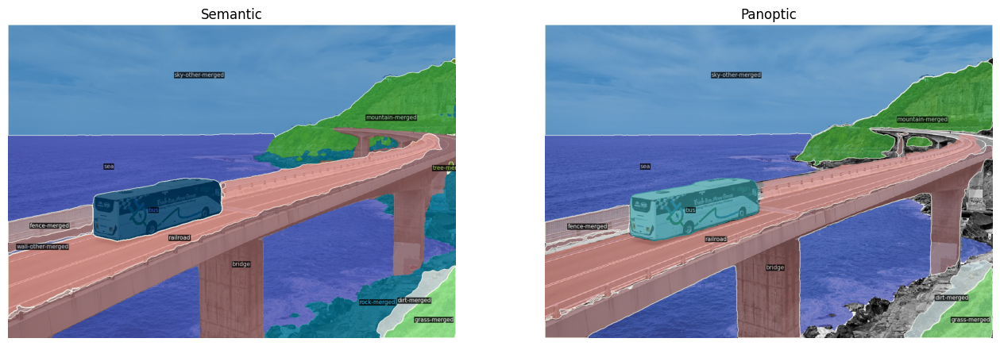

In [21]:
im = cv2.imread("/content/gdrive/MyDrive/Hugging Face/datasets/3d_tests/bus.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Semantic')
plt.axis('off')
plt.imshow(semantic_result)

plt.subplot(1, 2, 2)
plt.title('Panoptic')
plt.axis('off')
plt.imshow(panoptic_result)
plt.show()

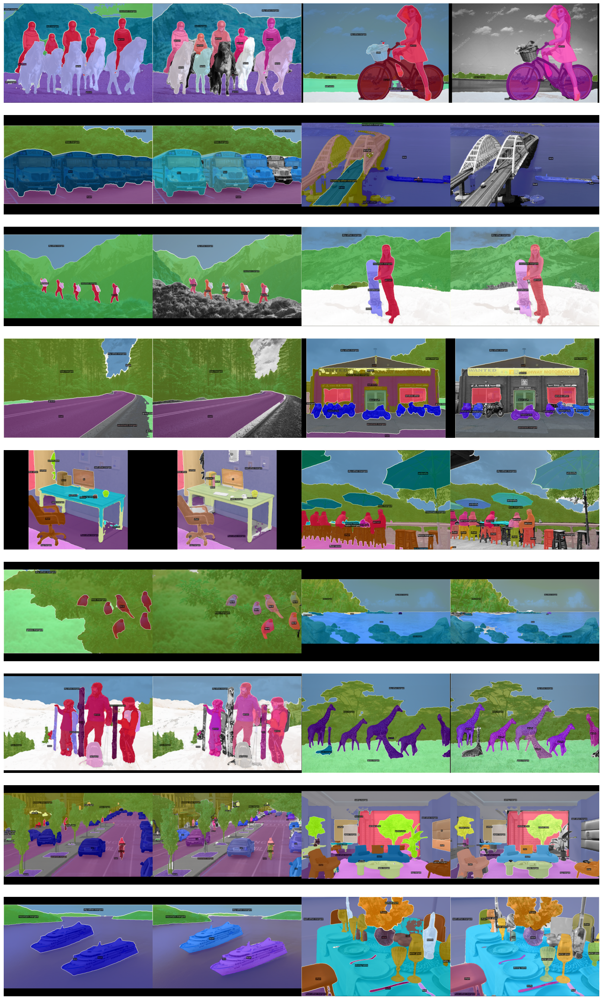

In [23]:
val_dir = "/content/gdrive/MyDrive/Hugging Face/datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image_pil = Image.open(image_path).convert("RGB")
    image_np = np.array(image_pil) # Convert PIL Image to NumPy array

    outputs = predictor(image_np)
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

    processed_imgs.append((semantic_result, panoptic_result))
    img_sizes.append(image_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

In [24]:
cfg = get_cfg()
add_yoso_config(cfg)

# Use YOSO with ResNet-50
cfg.merge_from_file("YOSO/projects/YOSO/configs/ade20k/panoptic-segmentation/YOSO-R50.yaml")
cfg.MODEL.WEIGHTS = "https://github.com/hujiecpp/YOSO/releases/download/v0.1/yoso_res50_ade20k.pth"

cfg.MODEL.YOSO.TEST.SEMANTIC_ON = True
cfg.MODEL.YOSO.TEST.INSTANCE_ON = True
cfg.MODEL.YOSO.TEST.PANOPTIC_ON = True

predictor = DefaultPredictor(cfg)

[04/10 13:27:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://github.com/hujiecpp/YOSO/releases/download/v0.1/yoso_res50_ade20k.pth ...


yoso_res50_ade20k.pth: 505MB [00:12, 40.8MB/s]                           


In [25]:
from detectron2.data import MetadataCatalog

# Register ADE20K classes
ade20k_classes = [
    "wall", "building", "sky", "floor", "tree", "ceiling", "road", "bed", "windowpane", "grass",
    "cabinet", "sidewalk", "person", "earth", "door", "table", "mountain", "plant", "curtain", "chair",
    "car", "water", "painting", "sofa", "shelf", "house", "sea", "mirror", "rug", "field",
    "armchair", "seat", "fence", "desk", "rock", "wardrobe", "lamp", "bathtub", "railing", "cushion",
    "base", "box", "column", "signboard", "chest of drawers", "counter", "sand", "sink", "skyscraper", "fireplace",
    "refrigerator", "grandstand", "path", "stairs", "runway", "case", "pool table", "pillow", "screen door", "stairway",
    "river", "bridge", "bookcase", "blind", "coffee table", "toilet", "flower", "book", "hill", "bench",
    "countertop", "stove", "palm", "kitchen island", "computer", "swivel chair", "boat", "bar", "arcade machine", "hovel",
    "bus", "towel", "light", "truck", "tower", "chandelier", "awning", "streetlight", "booth", "television receiver",
    "airplane", "dirt track", "apparel", "pole", "land", "bannister", "escalator", "ottoman", "bottle", "buffet",
    "poster", "stage", "van", "ship", "fountain", "conveyer belt", "canopy", "washer", "plaything", "swimming pool",
    "stool", "barrel", "basket", "waterfall", "tent", "bag", "minibike", "cradle", "oven", "ball",
    "food", "step", "tank", "trade name", "microwave", "pot", "animal", "bicycle", "lake", "dishwasher",
    "screen", "blanket", "sculpture", "hood", "sconce", "vase", "traffic light", "tray", "ashcan", "fan",
    "pier", "crt screen", "plate", "monitor", "bulletin board", "shower", "radiator", "glass", "clock", "flag"
]

MetadataCatalog.get("ade20k_panoptic").stuff_classes = ade20k_classes
MetadataCatalog.get("ade20k_panoptic").thing_classes = ade20k_classes
ade20k_metadata = MetadataCatalog.get("ade20k_panoptic")

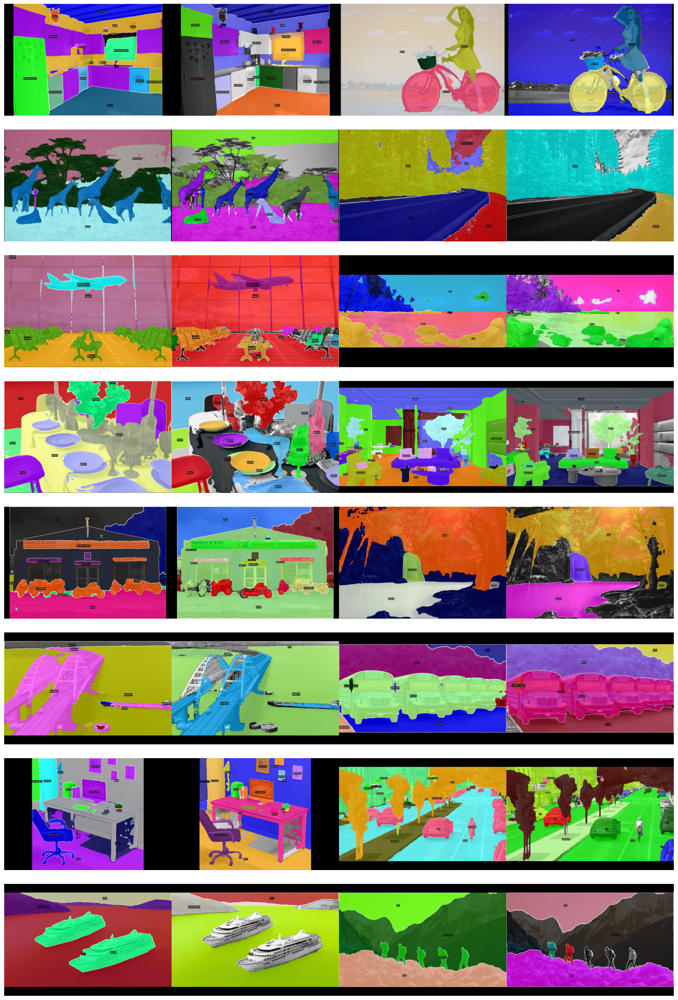

In [26]:
val_dir = "/content/gdrive/MyDrive/Hugging Face/datasets/panoptic-tests-ade"
num_samples = 16

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

# Load ADE20K metadata
ade20k_metadata = MetadataCatalog.get("ade20k_panoptic")

for image_path in img_paths:
    # Load image
    image_pil = Image.open(image_path).convert("RGB")
    image_np = np.array(image_pil) # Convert PIL Image to NumPy array

    outputs = predictor(image_np)
    v = Visualizer(image_np[:, :, ::-1], ade20k_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
    v = Visualizer(image_np[:, :, ::-1], ade20k_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

    processed_imgs.append((semantic_result, panoptic_result))
    img_sizes.append(image_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()